# Pretraining generator and critic models

Training a GAN can be hard.
This is mainly because of the initialization problem, in the beginning neither generator nor critic knows  which way to go, what is to optimize.
This is the case of 'blind leading the blind'.
Here we pretrain both models, before putting them together as a GAN.
(credits to J. Howard, fast.ai)

Check out how the crappy images were generated: https://www.kaggle.com/greenahn/crappify-imgs

Another version of this notebook with some supervised features in loss function (Mean Absolute Error + FeatureLoss) is at: https://www.kaggle.com/greenahn/pretrain-gan-feature-loss

Github repository: https://github.com/nupam/GANs-for-Image-enhancement/

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
print(os.listdir("../input"))

from tqdm import tqdm_notebook as tqdm

import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *
from fastai.vision.gan import *
import gc
from torchvision.models import vgg16_bn

['flickr-image-dataset', 'flickrproc']


In [2]:
## These folders contain crappy images in different resolution with differnt crappafication logic (randomly selected)
orig_path = Path('../input/flickrproc/hr/hr')
fnames_df = pd.read_csv('../input/flickrproc/files.csv')

FOLDERS = {256:Path('../input/flickrproc/crappy_256/crappy/'), 320:Path('../input/flickrproc/crappy_320/crappy/'), }
FOLDERS

{256: PosixPath('../input/flickrproc/crappy_256/crappy'),
 320: PosixPath('../input/flickrproc/crappy_320/crappy')}

## Getting images ready

### First, let us have a look at the dataset

In [3]:
src=ImageList.from_df(fnames_df, path = orig_path, cols='name')
src

ImageList (31783 items)
Image (3, 479, 321),Image (3, 428, 321),Image (3, 321, 481),Image (3, 321, 428),Image (3, 321, 428)
Path: ../input/flickrproc/hr/hr

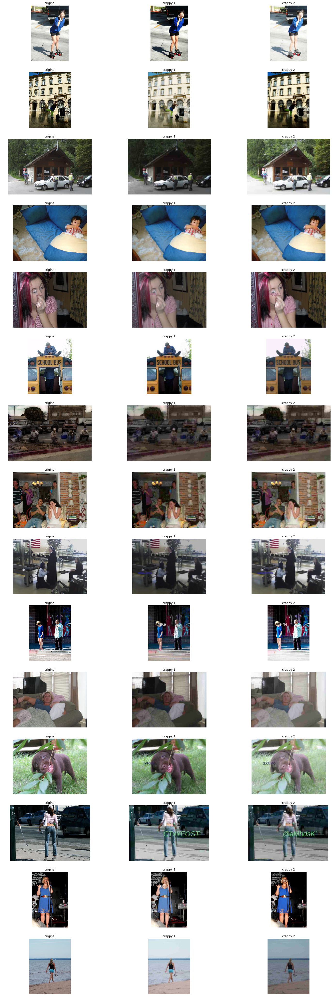

In [4]:
def plot_one(r, c, ax):
    figsize = (6,6)
    name = Path(src.items[r]).name
    if c == 0:
        ax.title.set_text('original')
        open_image(src.items[r]).show(ax, figsize=figsize)
    else:
        ax.title.set_text('crappy ' + str(c))
        open_image(list(FOLDERS.values())[c-1]/name).show(ax, figsize=figsize)
        
plot_multi(plot_one, 15, 3, figsize=(25, 75))
del src

In [5]:
def get_data(size, bs, folder=256, split=0.9):
    folder = FOLDERS[folder]
    src = ImageImageList.from_df(fnames_df, 
                           path = folder, cols='name')
    src = src.split_by_idx(np.arange(int(src.items.shape[0]*split), src.items.shape[0]))
    
    data = src.label_from_func(lambda x: orig_path/Path(x).name).transform(get_transforms(), size=size, tfm_y=True).databunch(bs=bs).normalize(imagenet_stats, do_y=True)
    data.c = 3
    return data

In [6]:
data_gen = get_data(128,32, 256)

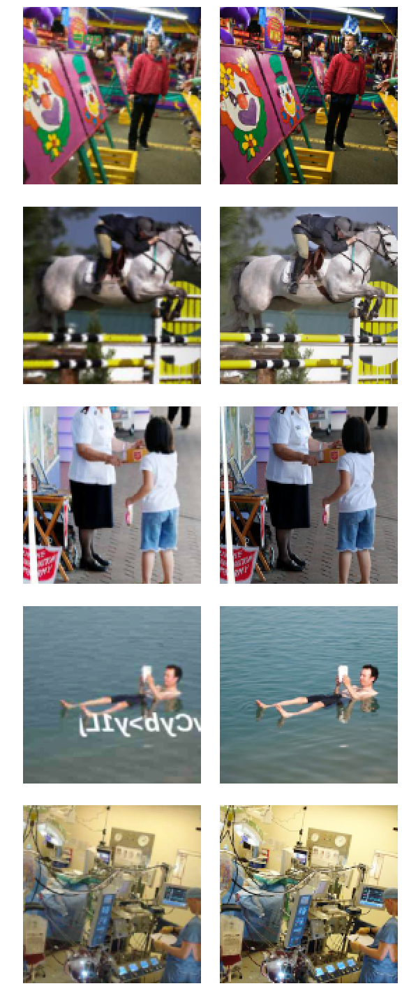

In [7]:
data_gen.show_batch()

## Generator

### Loss Function
Its is simple Mean squared error between input and generated images.

### Model
The model used here is a unet with pretrained resnet34
weight normalization is used for stabalizing the learning process, as batch-normalization adds noise and in GANs it is not desireable

In [8]:
wd = 1e-3
y_range = (-3.,3.)
loss_gen = MSELossFlat()
arch = models.resnet34

def create_gen_learner():
    return unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Weight,
                         self_attention=True, y_range=y_range, loss_func=loss_gen, model_dir="/kaggle/working/")

## Training

In [9]:
learn_gen = create_gen_learner()

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /tmp/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:00<00:00, 151405885.35it/s]


LR selection

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


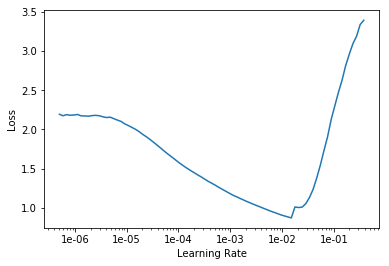

In [10]:
learn_gen = learn_gen.to_fp16()
learn_gen.lr_find(end_lr=1) ## LR selection
learn_gen.recorder.plot()

In [11]:
learn_gen.fit_one_cycle(1,1.2e-3, pct_start=0.7)

epoch,train_loss,valid_loss,time
0,0.210649,0.197926,10:13


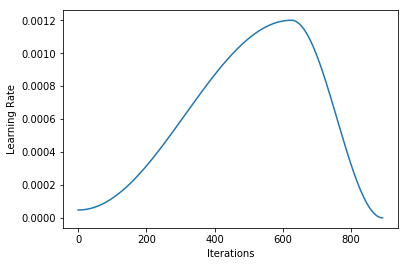

In [12]:
learn_gen.recorder.plot_lr()

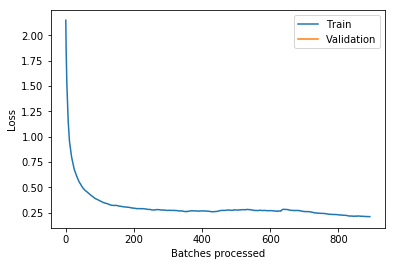

In [13]:
learn_gen.recorder.plot_losses()

In [14]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(1, slice(1e-5,6e-4), pct_start=0.5)

epoch,train_loss,valid_loss,time
0,0.205238,0.195054,10:11


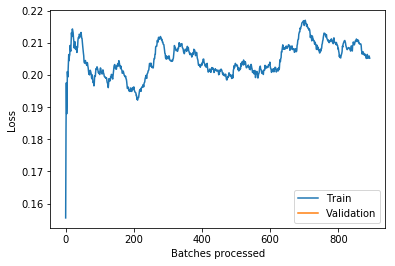

In [15]:
learn_gen.recorder.plot_losses()

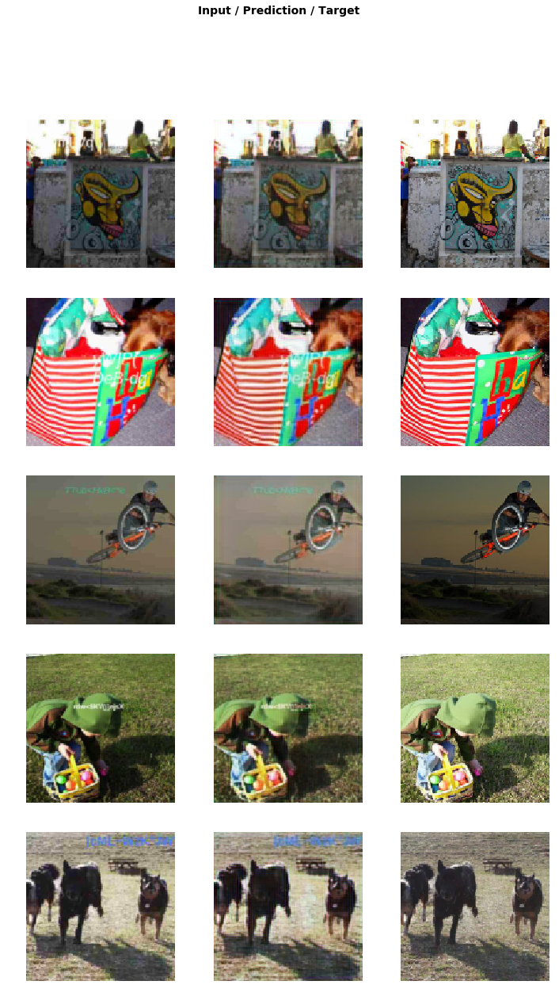

In [16]:
learn_gen.show_results()

### Increasing Image size
we increase the image size to 256 and train again

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


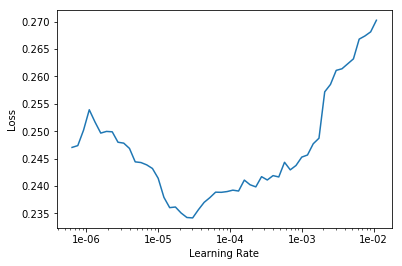

In [17]:
learn_gen.freeze()
del learn_gen.data, data_gen
learn_gen.data = get_data(bs=32, size=256)
learn_gen = learn_gen.to_fp16()
gc.collect()

learn_gen.lr_find()
learn_gen.recorder.plot()

In [18]:
learn_gen.fit_one_cycle(2, 0.0008, pct_start=0.5)

epoch,train_loss,valid_loss,time
0,0.198599,0.175635,14:32
1,0.174251,0.158943,14:27


In [19]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(3, slice(8e-6,6e-4))

epoch,train_loss,valid_loss,time
0,0.186534,0.167995,15:04
1,0.171068,0.155804,15:17
2,0.158741,0.150069,15:19


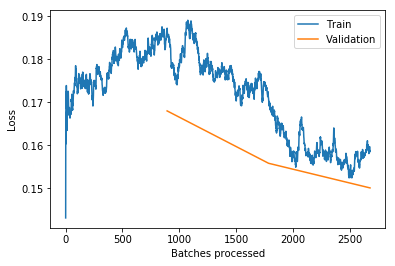

In [20]:
learn_gen.recorder.plot_losses()

In [21]:
learn_gen = learn_gen.to_fp32()
learn_gen.save('gen_pre')

### how does it performs now?

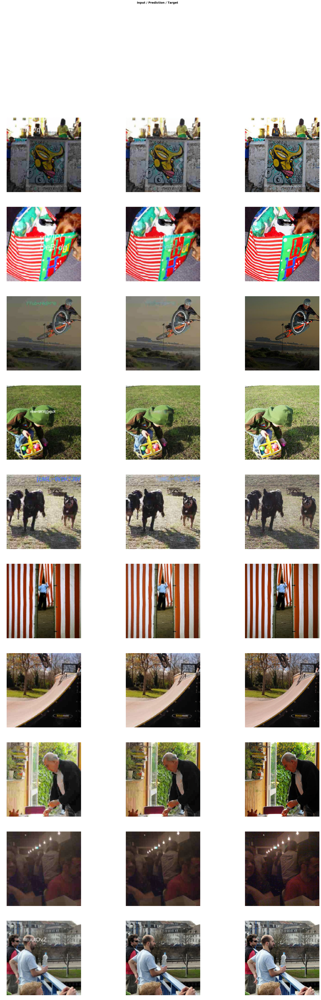

In [22]:
learn_gen.show_results(rows=10, figsize=(30, 80))

Generated images are blurry, it understands where texts are and tries to remove them, but high level features like eyes, lines, circles, fur etc. are ignored.
Generated images seem good enough for pretraing, generator will not be blind anymore.

## Saving generated images
We are going then to use it for pretraining critic

In [23]:
!rm -rf gen_imgs/
!mkdir gen_imgs

In [24]:
path_gen = Path('gen_imgs/')

def save_preds(dl):
    i=0
    names = dl.dataset.items
    
    for b in tqdm(dl):
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o.save(path_gen/Path(names[i]).name)
            i += 1
        del preds
    del names
    gc.collect()

In [25]:
del learn_gen.data
gc.collect()
torch.cuda.empty_cache()
gpu_mem_get_free()

13573

/opt/conda/lib/python3.6/site-packages/fastai/data_block.py:454: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")


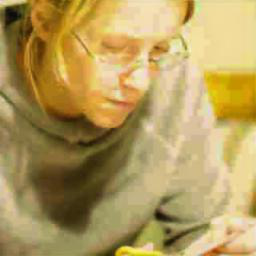

In [26]:
learn_gen.data = get_data(256, 16, 256, 1.0)
save_preds(learn_gen.data.fix_dl)
open_image(path_gen.ls()[0])

In [27]:
del  learn_gen
gc.collect()
torch.cuda.empty_cache()
gpu_mem_get_free()

15597

## Critic

### Data
We use the above generated images as of one class and original images of another.

In [28]:
def get_critic_data(bs, size=256, split=0.9):
    
    def labeler(x):
        ret = 'generated' if Path(x).parent.name == 'gen_imgs' else 'original'
        return ret
    
    df = fnames_df
    valid_names = list(df['name'].iloc[int(split*len(df)):])
    
    src1 = ImageList.from_df(df, path = Path('gen_imgs'), cols='name')
    src2 = ImageList.from_df(df, path = orig_path, cols='name')
    src1.add(items=src2)
    
    src = src1.split_by_valid_func(lambda x : Path(x).name in valid_names)
    data = src.label_from_func(labeler)
    data = data.transform(get_transforms(), size=size).databunch(bs=bs).normalize(imagenet_stats)
    
    data.c = 3
    return data

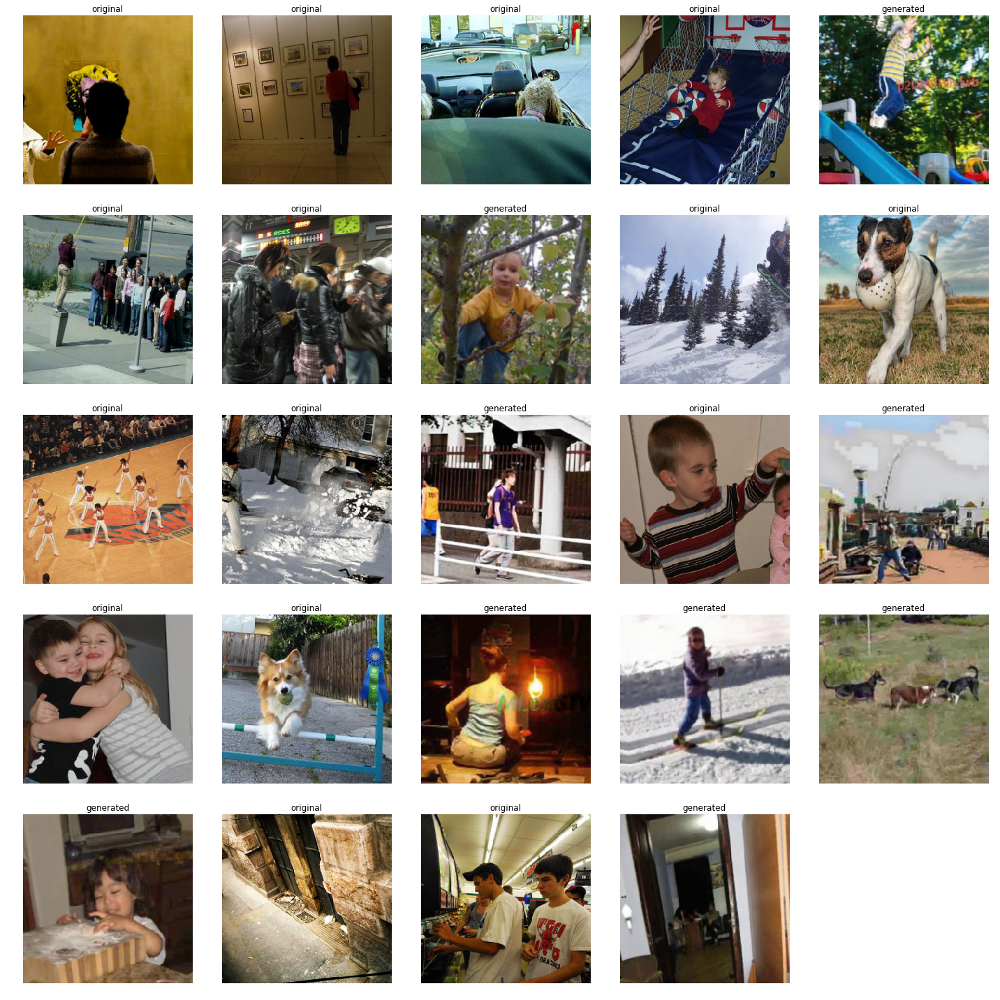

In [29]:
data_critic = get_critic_data(24)
data_critic.show_batch()

### Model
Model used is fast.ai gran_critic with default parameters, it uses spectral normalization, which keeps loss from vanishing or exploding.

In [30]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())

def create_critic_learner(data, metrics):
    return   Learner(data_critic, gan_critic(), metrics=metrics, loss_func=loss_critic, wd=wd, model_dir="/kaggle/working/")

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


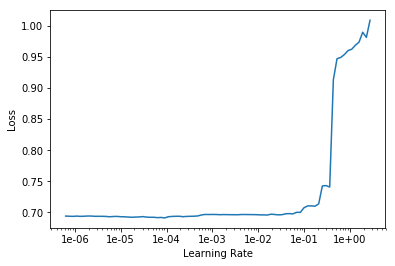

In [31]:
learn_critic = create_critic_learner(data_critic, accuracy_thresh_expand)
learn_critic.lr_find()
learn_critic.recorder.plot()

In [32]:
learn_critic.fit_one_cycle(1, 1e-3)

epoch,train_loss,valid_loss,accuracy_thresh_expand,time
0,0.091287,0.122800,0.954774,35:04


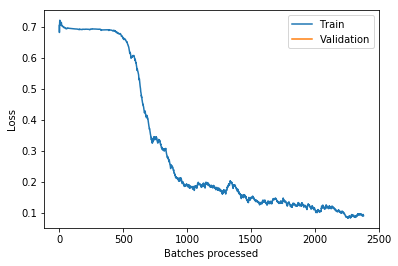

In [33]:
learn_critic.recorder.plot_losses()

In [34]:
learn_critic.save('critic-pre')
!rm -rf gen_imgs/

In [35]:
rm tmp.pth

In [36]:
!ls

__notebook_source__.ipynb  critic-pre.pth  gen_pre.pth
